In [1]:
# prompt: mount drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Installation

In [2]:
!pip install cmake
!pip install dlib
!pip install face_recognition

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566170 sha256=448a3104b3edeeb54e843fd166692f1a088acc406814cb680a7d9dc3e8f9bdaf
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models


In [3]:
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 33.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 24.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 39.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [4]:
!pip install flask-ngrok
!pip install pyngrok
!pip install opencv-python-headless
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 31.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 26.5 MB/s eta 0:00:00


# Imports

In [5]:
import face_recognition

In [6]:
import os
import cv2
from flask_ngrok import run_with_ngrok
from flask import Flask, Request,render_template,request
import pickle
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter
from google.colab.patches import cv2_imshow
import matplotlib
import matplotlib.pyplot as plt
import easyocr
import csv
import uuid
import time

from flask import Flask, render_template
from pyngrok import ngrok


# Flask app

In [7]:
!ngrok config add-authtoken 2fDMFsNtp53XEd4CSM8aCyhcBKZ_88L1UjsBw4dsbc3W1ymRT

Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


 * Running on https://3ee5-35-204-90-249.ngrok-free.app
 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:41:11] "GET / HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:41:12] "GET /static/welcome.gif HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:41:15] "GET /Home HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:41:17] "GET /static/frs_image.jpg HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:41:17] "GET /static/anprs_image.jpg HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:41:17] "GET /static/footer_image.jpg HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:41:17] "GET /static/Eagle_Eye_logo.png HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:41:19] "GET /favicon.ico HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:41:27] "GET /FRS HTTP/1.1" 200 -
INFO

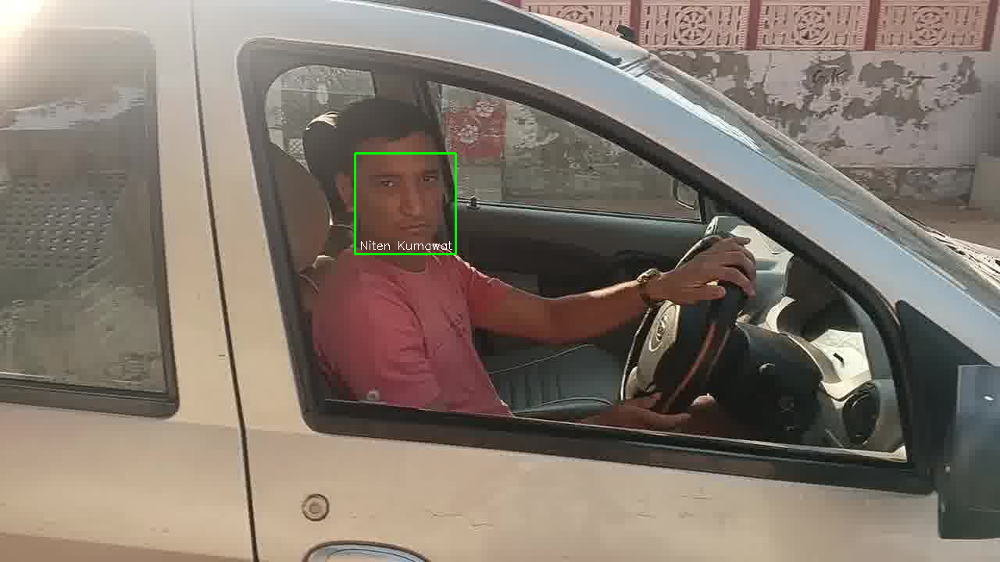

INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:06] "POST /FRS HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:07] "GET /static/footer_image.jpg HTTP/1.1" 304 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:07] "GET /static/detected_faces/Niten%20Kumawat.jpg HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:07] "GET /static/frs_image.jpg HTTP/1.1" 304 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:07] "GET /static/known_faces/Niten%20Kumawat.jpg HTTP/1.1" 304 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:07] "GET /static/Eagle_Eye_logo.png HTTP/1.1" 304 -


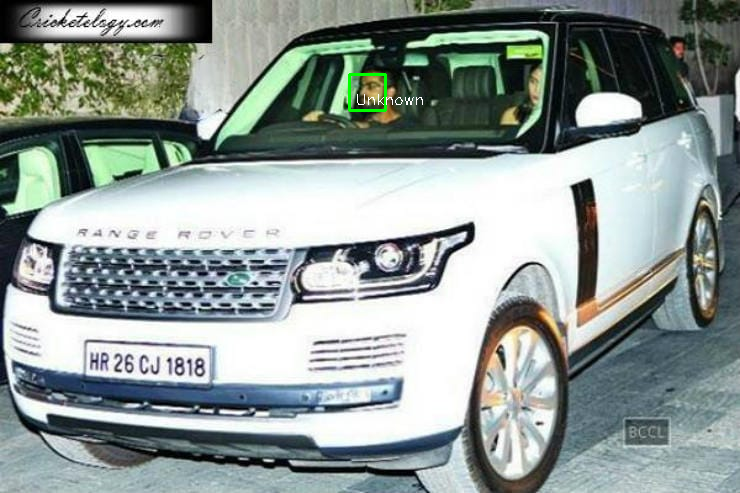

INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:36] "POST /FRS HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:37] "GET /static/frs_image.jpg HTTP/1.1" 304 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:37] "GET /static/footer_image.jpg HTTP/1.1" 304 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:37] "GET /static/Eagle_Eye_logo.png HTTP/1.1" 304 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:37] "GET /static/detected_faces/Unknown.jpg HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [18/May/2024 04:43:37] "GET /static/known_faces/Unknown.jpg HTTP/1.1" 404 -


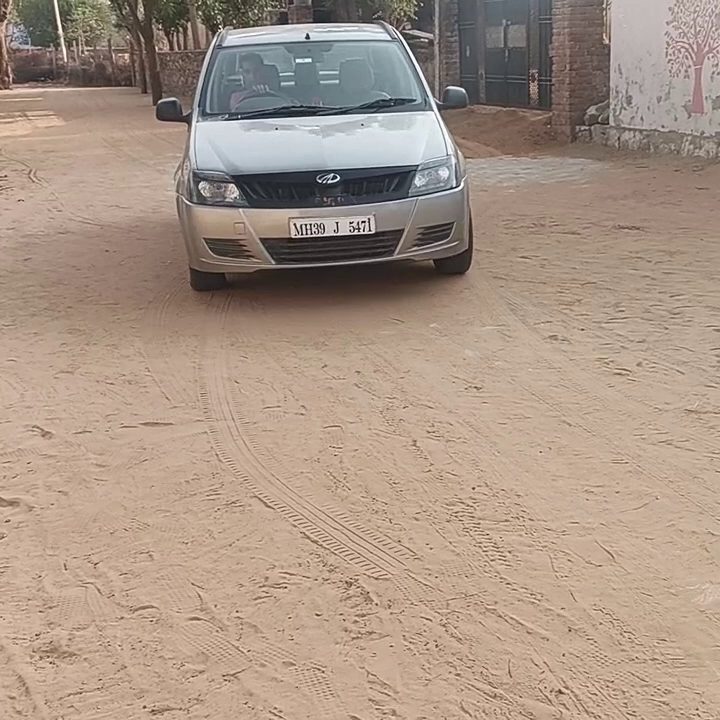

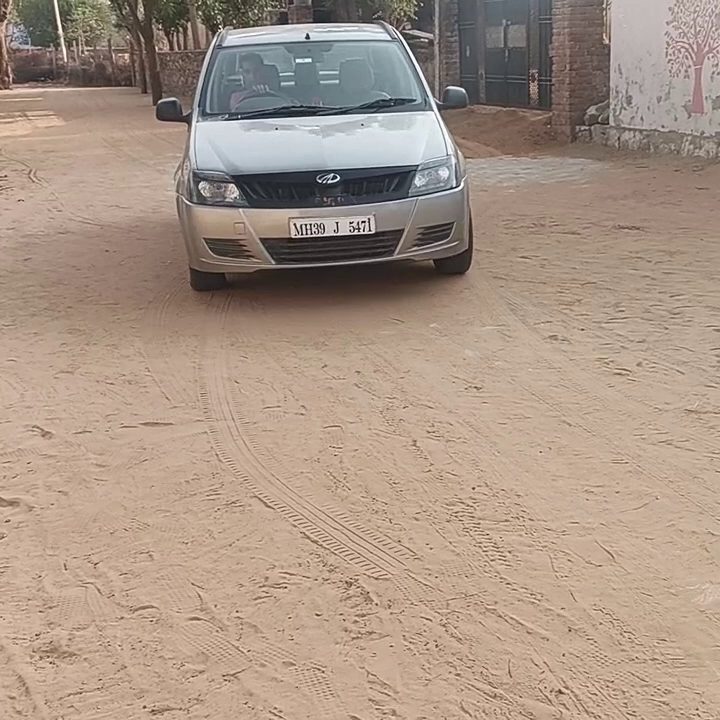

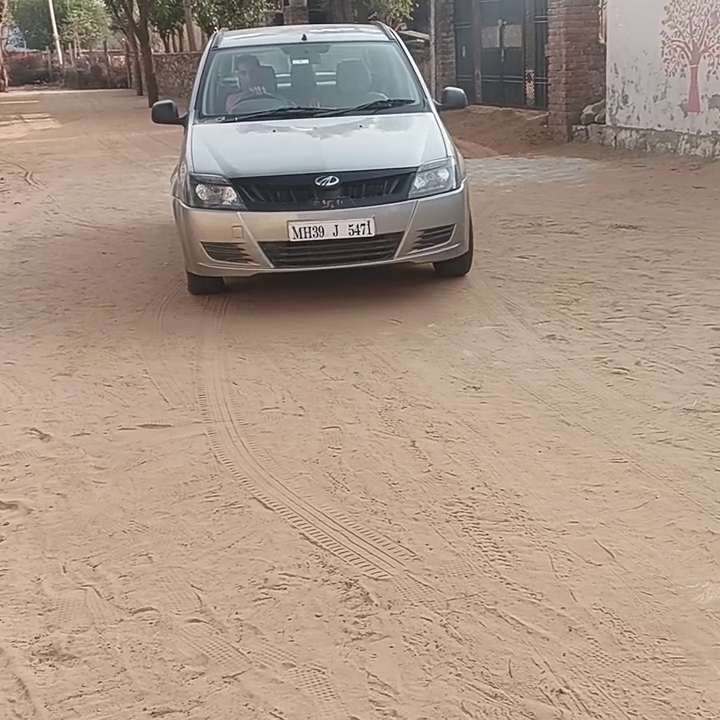

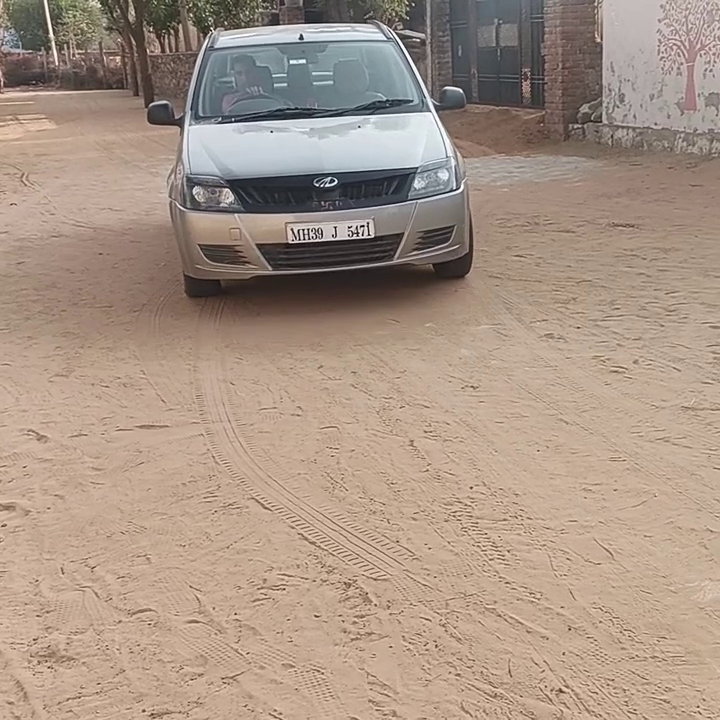

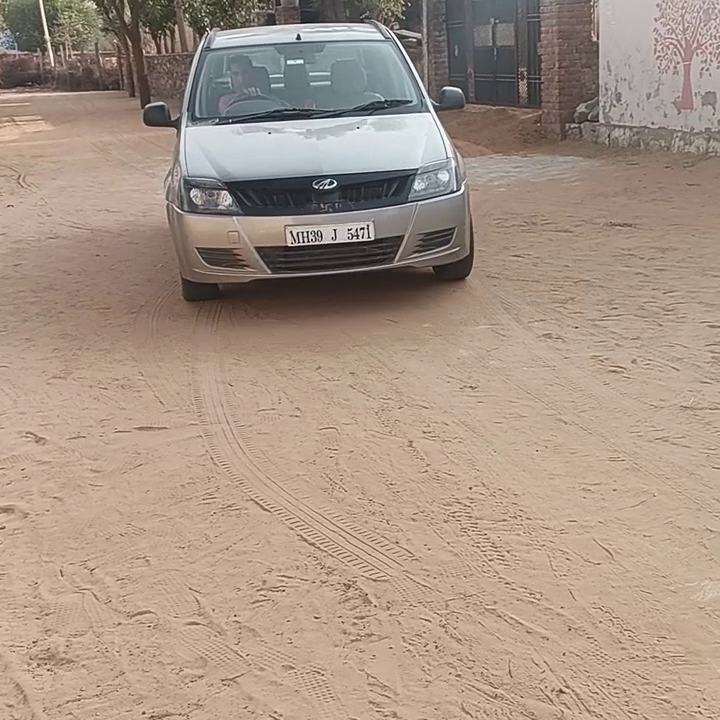

...

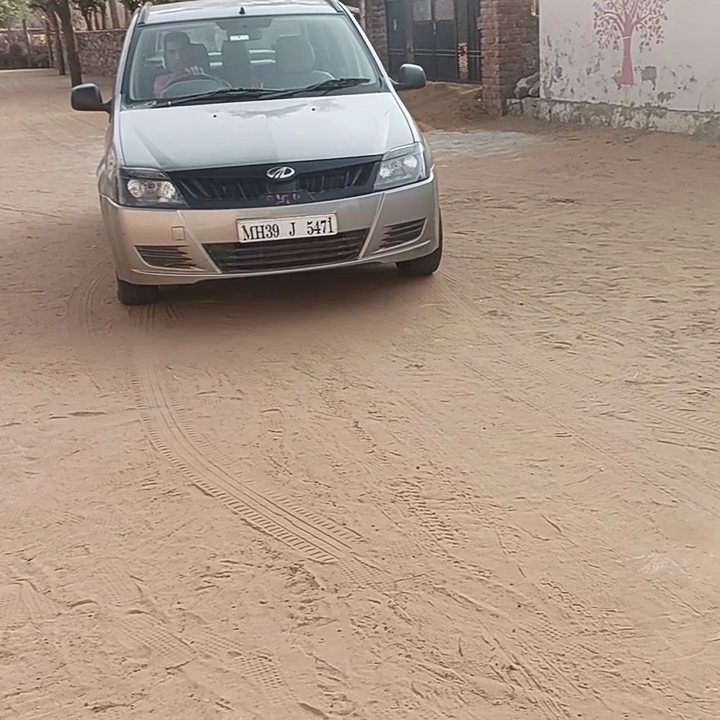

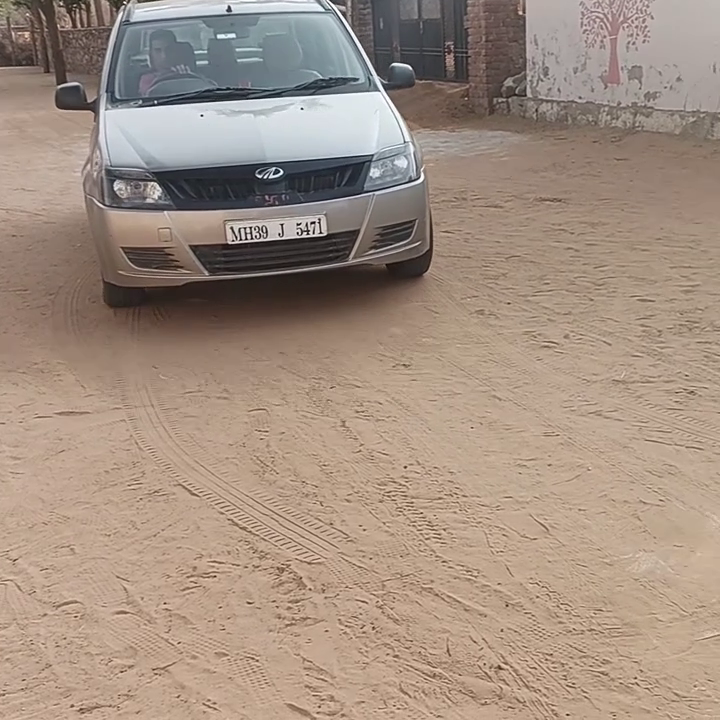

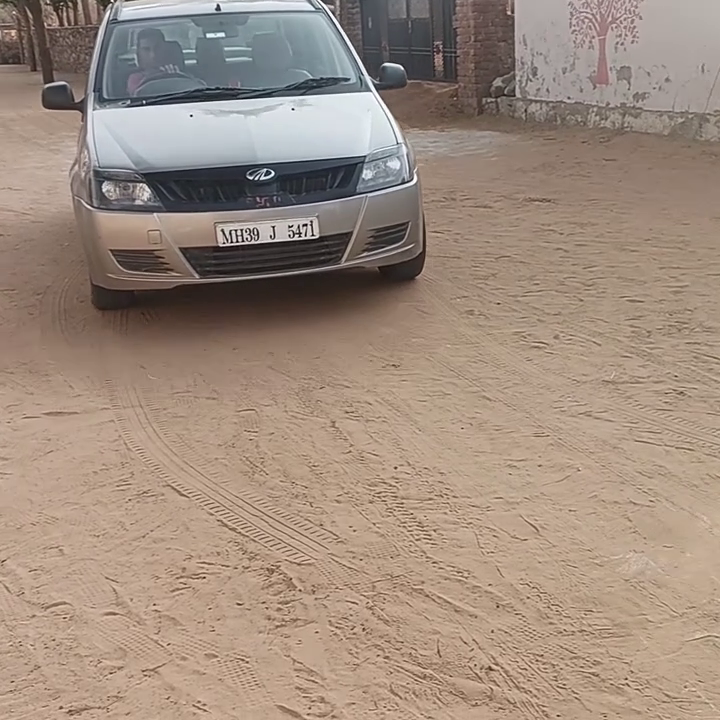

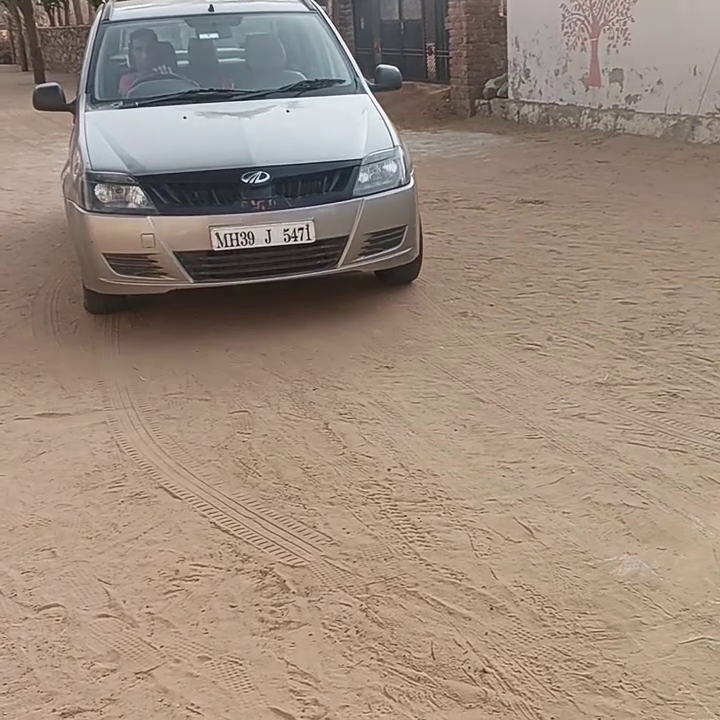

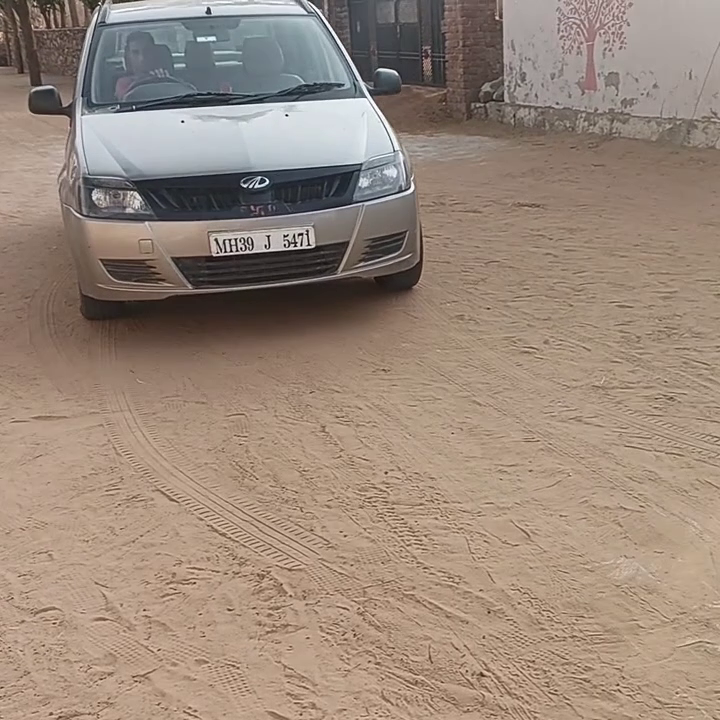

In [ ]:
os.chdir('/content/drive/MyDrive/ANPRS AND FRS Solutions/WEBAPP')
# Create the Flask app instance
app = Flask(__name__, static_url_path='/static', static_folder='static')
    # Change directory to where your files are located
BASE_PATH = os.getcwd()
UPLOAD_PATH_ANPRS = os.path.join(BASE_PATH,'static/upload/For_anprs')
UPLOAD_PATH_FRS = os.path.join(BASE_PATH,'static/upload/For_frs')
@app.route('/')
def index():
    return render_template('index.html')
@app.route('/Home')
def Home():
    return render_template('Home.html')

@app.route('/ANPRS', methods=['POST', 'GET'])
def ANPRS():
    def ocr_it(image, detections, detection_threshold, region_threshold):
        # Initialize EasyOCR reader
        reader = easyocr.Reader(['en'])

        # Process detections
        for detection in detections:
          xmin, ymin, xmax, ymax, confidence = detection
          region = image[ymin:ymax, xmin:xmax]
          ocr_result = reader.readtext(region)


          # Define function to filter OCR results based on region size
          def filter_text(region, ocr_result, region_threshold):
              rectangle_size = region.shape[0] * region.shape[1]
              plate = []
              for result in ocr_result:
                  length = np.sum(np.subtract(result[0][1], result[0][0]))
                  height = np.sum(np.subtract(result[0][2], result[0][1]))
                  if length * height / rectangle_size > region_threshold:
                      plate.append(result[1])
              return plate

          text = filter_text(region, ocr_result, region_threshold)
          roi_bgr = cv2.cvtColor(region,cv2.COLOR_RGB2BGR)
          #filename_without_extension = filename.split(".")[0]
          #cv2.imwrite('./static/roi/{}.jpg'.format(filename_without_extension), roi_bgr)

          plt.imshow(cv2.cvtColor(region, cv2.COLOR_BGR2RGB))
          plt.show()
          print(text)
          return text,roi_bgr

    # Define the paths
    csv_filename = './static/detection_results.csv'
    Detection_Images = './static/roi'
    Predict_Images = './static/predict'

    # Create the directory for saving images if it doesn't exist
    if not os.path.exists(Predict_Images):
        os.makedirs(Predict_Images)

    # Create the directory for saving images if it doesn't exist
    if not os.path.exists(Detection_Images):
        os.makedirs(Detection_Images)


    def save_results(predict,text, region, csv_filename, image_dir1,image_dir2):
        # Generate a unique filename for the image
        image_filename = '{}.jpg'.format(uuid.uuid1())
        # Save the image to the specified directory
        cv2.imwrite(os.path.join(image_dir1, image_filename), region)
        cv2.imwrite(os.path.join(image_dir2, image_filename), predict)
        # Append the results to the CSV file
        with open(csv_filename, mode='a', newline='') as file:
            writer = csv.writer(file)
            writer.writerow([image_filename, text])
        return image_filename


    if request.method == 'POST' and 'image_name' in request.files:
        upload_file = request.files['image_name']
        filename = upload_file.filename
        path_save = os.path.join(UPLOAD_PATH_ANPRS, filename)
        upload_file.save(path_save)
        modelpath='./static/custom_model_lite/detect.tflite'
        lblpath='./static/custom_model_lite/labelmap.txt'
        min_conf=0.5
        region_threshold=0.05

        # Load the TensorFlow Lite model
        interpreter = Interpreter(model_path=modelpath)
        interpreter.allocate_tensors()
        input_details = interpreter.get_input_details()
        output_details = interpreter.get_output_details()
        height = input_details[0]['shape'][1]
        width = input_details[0]['shape'][2]
        float_input = (input_details[0]['dtype'] == np.float32)
        input_mean = 127.5
        input_std = 127.5

        texts = []  # Array to store texts
        image_filenames = []  # Array to store image filenames

        with open(lblpath, 'r') as f:
            labels = [line.strip() for line in f.readlines()]

        # Read the image

        image = cv2.imread(path_save)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        imH, imW, _ = image.shape
        image_resized = cv2.resize(image_rgb, (width, height))
        input_data = np.expand_dims(image_resized, axis=0)

        # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
        if float_input:
            input_data = (np.float32(input_data) - input_mean) / input_std

        # Perform the actual detection by running the model with the image as input
        interpreter.set_tensor(input_details[0]['index'], input_data)
        interpreter.invoke()

        boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
        classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
        scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

        detections = []


        for i in range(len(scores)):
            if ((scores[i] > min_conf) and (scores[i] <= 1.0)):
                ymin = int(max(1, (boxes[i][0] * imH)))
                xmin = int(max(1, (boxes[i][1] * imW)))
                ymax = int(min(imH, (boxes[i][2] * imH)))
                xmax = int(min(imW, (boxes[i][3] * imW)))
                cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)  # Draw bounding box
                object_name = labels[int(classes[i])]  # Look up object name
                label = '%s: %d%%' % (object_name, int(scores[i]*100))  # Create label text
                labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)  # Get label size
                label_ymin = max(ymin, labelSize[1] + 10)  # Ensure label is not too close to the top
                cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED)  # Draw white box for label
                cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)  # Draw label text
                detections.append((xmin, ymin, xmax, ymax, scores[i]))  # Store detection information as a tuple


        text, roi_bgr= ocr_it(image_rgb, detections, min_conf, region_threshold)
        image_filename=save_results(image,text, roi_bgr, csv_filename, Detection_Images,Predict_Images)
        texts.append(text)  # Append text to array
        image_filenames.append(image_filename)  # Append image filename to array

        return render_template('ANPRS.html', upload=True,saved_filenames=image_filenames,  upload_image = filename,texts=texts)



    elif request.method == 'POST' and 'video_name' in request.files:
        upload_file = request.files['video_name']
        filename = upload_file.filename
        path_save = os.path.join(UPLOAD_PATH_ANPRS, filename)
        upload_file.save(path_save)
        modelpath='./static/custom_model_lite/detect.tflite'
        lblpath='./static/custom_model_lite/labelmap.txt'
        min_conf=0.5
        region_threshold=0.05
        cap = cv2.VideoCapture(path_save)
        interpreter = Interpreter(model_path=modelpath)
        interpreter.allocate_tensors()
        input_details = interpreter.get_input_details()
        output_details = interpreter.get_output_details()
        height = input_details[0]['shape'][1]
        width = input_details[0]['shape'][2]

        texts = []  # Array to store texts
        image_filenames = []  # Array to store image filenames

        float_input = (input_details[0]['dtype'] == np.float32)

        input_mean = 127.5
        input_std = 127.5

        with open(lblpath, 'r') as f:
            labels = [line.strip() for line in f.readlines()]

        frame_interval_sec = 0.2  # Process every 0.1 seconds
        prev_frame_time = time.time()

        while True:
            ret, frame = cap.read()
            if not ret:
                break

            current_time = time.time()
            if current_time - prev_frame_time < frame_interval_sec:
                continue  # Skip this frame

            prev_frame_time = current_time

            image_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            imH, imW, _ = frame.shape
            image_resized = cv2.resize(image_rgb, (width, height))
            input_data = np.expand_dims(image_resized, axis=0)

            if float_input:
                input_data = (np.float32(input_data) - input_mean) / input_std

            interpreter.set_tensor(input_details[0]['index'], input_data)
            interpreter.invoke()

            boxes = interpreter.get_tensor(output_details[1]['index'])[0]
            classes = interpreter.get_tensor(output_details[3]['index'])[0]
            scores = interpreter.get_tensor(output_details[0]['index'])[0]

            detections = []

            for i in range(len(scores)):
                if ((scores[i] > min_conf) and (scores[i] <= 1.0)):
                    ymin = int(max(1, (boxes[i][0] * imH)))
                    xmin = int(max(1, (boxes[i][1] * imW)))
                    ymax = int(min(imH, (boxes[i][2] * imH)))
                    xmax = int(min(imW, (boxes[i][3] * imW)))
                    cv2.rectangle(frame, (xmin, ymin), (xmax, ymax), (10, 255, 0), 2)
                    object_name = labels[int(classes[i])]
                    label = '%s: %d%%' % (object_name, int(scores[i] * 100))
                    labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)
                    label_ymin = max(ymin, labelSize[1] + 10)
                    cv2.rectangle(frame, (xmin, label_ymin - labelSize[1] - 10),
                                  (xmin + labelSize[0], label_ymin + baseLine - 10), (255, 255, 255), cv2.FILLED)
                    cv2.putText(frame, label, (xmin, label_ymin - 7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)
                    detections.append([xmin, ymin, xmax, ymax, scores[i]])





            try:
              text, roi_bgr = ocr_it(image_rgb, detections, min_conf, region_threshold)
              image_filename = save_results(frame, text, roi_bgr, csv_filename, Detection_Images, Predict_Images)
              texts.append(text)  # Append text to array
              image_filenames.append(image_filename)  # Append image filename to array
            except Exception as e:
              print("Error:", e)
              pass
            cv2_imshow(frame)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break

        cap.release()




        return render_template('ANPRS.html', upload=True,saved_filenames=image_filenames,  upload_image=filename,texts=texts)


    return render_template('ANPRS.html',upload=False)




# for face recognization
@app.route('/FRS', methods=['POST', 'GET'])
def FRS():

  # Path to the directory containing the images
  image_dir = './static/known_faces'

  # List to store face encodings
  known_face_encodings = []
  known_face_names = []

  # Iterate through each item (files and directories) in the directory
  for item in os.listdir(image_dir):
      # Create the full path to the item
      item_path = os.path.join(image_dir, item)
      # Check if the item is a file
      if os.path.isfile(item_path):
          # Load the image
          image = face_recognition.load_image_file(item_path)
          # Encode the face
          face_encoding = face_recognition.face_encodings(image)[0]
          # Extract the name from the filename (assuming filename is in the format "name.jpg")
          name = os.path.splitext(item)[0]
          # Append the encoding and name to the lists
          known_face_encodings.append(face_encoding)
          known_face_names.append(name)


  if request.method == 'POST' and 'image_name' in request.files:
        upload_file = request.files['image_name']
        filename = upload_file.filename
        path_save = os.path.join(UPLOAD_PATH_FRS, filename)
        upload_file.save(path_save)
        # Extracting extension from filename
        extension = filename.split(".")[-1]

        # Load the image for face recognition
        image = cv2.imread(path_save)
        # Find all the faces and face encodings in the image
        face_locations = face_recognition.face_locations(image)
        face_encodings = face_recognition.face_encodings(image, face_locations)

        # Loop through each face found in the image
        for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
            # Compare the face with known faces
            matches = face_recognition.compare_faces(known_face_encodings, face_encoding)
            name = "Unknown"

            # If a match is found, use the name of the known face
            if True in matches:
                first_match_index = matches.index(True)
                name = known_face_names[first_match_index]

            # Draw a rectangle around the face
            cv2.rectangle(image, (left, top), (right, bottom), (0, 255, 0), 2)

            # Put the name of the person on the image
            cv2.putText(image, name, (left + 6, bottom - 6), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        cv2.imwrite(f"./static/detected_faces/{name}.{extension}", image)
        # Display the resulting image
        cv2_imshow(image)




        return render_template('FRS.html', upload=True,ext=extension,name=name)


  elif request.method == 'POST' and 'video_name' in request.files:
        upload_file = request.files['video_name']
        filename = upload_file.filename
        path_save = os.path.join(UPLOAD_PATH_FRS, filename)
        upload_file.save(path_save)
        # Open the video file
        video_capture = cv2.VideoCapture(path_save)
        extension="jpg"

        # Initialize variables to store the names of matched faces and a flag to indicate match found
        matched_faces = []
        match_found = False

        # Read the video frame by frame
        while True:
            # Capture frame-by-frame
            ret, frame = video_capture.read()

            # Break the loop if there are no more frames or if match is found
            if not ret or match_found:
                break

            # Detect faces in the current frame
            face_locations = face_recognition.face_locations(frame)
            face_encodings = face_recognition.face_encodings(frame, face_locations)

            # Iterate through each detected face
            for face_encoding, (top, right, bottom, left) in zip(face_encodings, face_locations):
                # Compare the face with known faces
                matches = face_recognition.compare_faces(known_face_encodings, face_encoding)

                # If a match is found, use the name of the known face and set match_found to True
                if True in matches:
                    first_match_index = matches.index(True)
                    name = known_face_names[first_match_index]
                    match_found = True

                    # Draw a rectangle around the face
                    cv2.rectangle(frame, (left, top), (right, bottom), (0, 255, 0), 2)

                    # Put the name of the person on the image
                    cv2.putText(frame, name, (left + 6, bottom - 6), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

                    # Save the matched frame

                    cv2.imwrite(f"./static/detected_faces/{name}.{extension}", frame)



                    break
                # Draw a rectangle around the face
                cv2.rectangle(frame, (left, top), (right, bottom), (0, 255, 0), 2)

                # Put the name of the person on the image
                cv2.putText(frame, "Matching...", (left + 6, bottom - 6), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

            # Display the resulting frame
            cv2_imshow(frame)

        # Release the video file
        video_capture.release()

        # Print the matched faces if match is found
        if match_found:
            print("Matched Face:")
            print(name)


        return render_template('FRS.html', upload=True,ext=extension, name=name)


  return render_template('FRS.html', upload= False)
@app.route('/About_us')
def About_us():
    return render_template('About_us.html')




if __name__ == '__main__':

    # Start ngrok tunnel
    public_url = ngrok.connect(5000).public_url
    print(" * Running on", public_url)

    # Start Flask app
    app.run()